In [14]:
!pip install opencv-python
!pip install opencv-python pytesseract matplotlib
!pip install easyocr


DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 4.8 MB/s eta 0:00:00ta 0:00:01
  DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
  DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
  DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
  DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


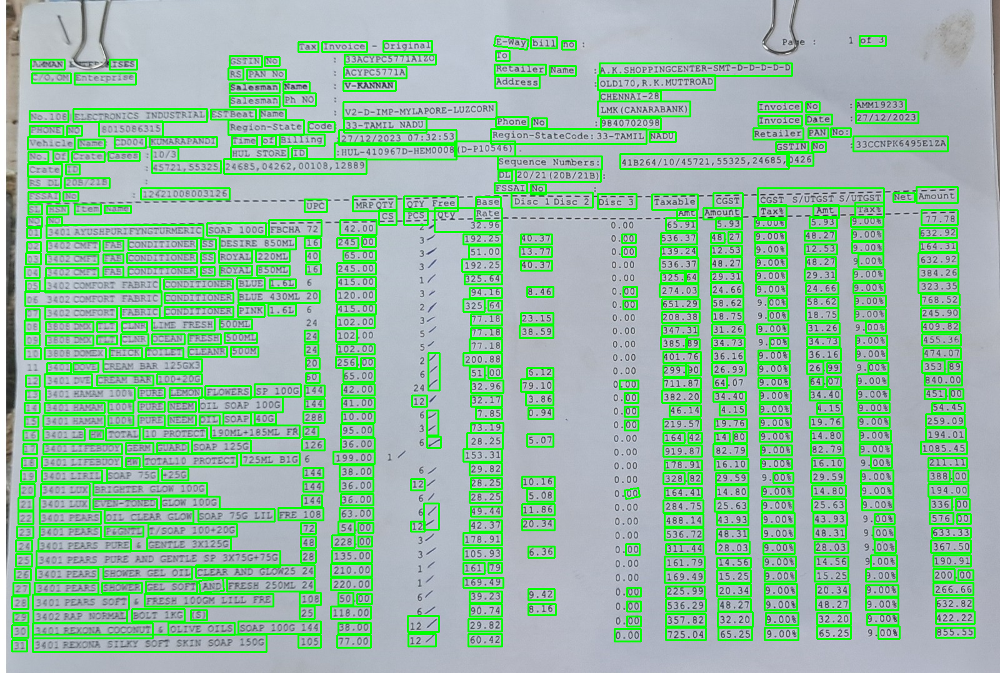

Detected Text:

Tax
Invoice
Original
bill
no
of 3
GSTIN
No
JBACYPC57TIAIZO
To
LN
USES
ACYPC5771A
Retafler
Name
A.K. SHOPPINGCENTER-SMT-D-D-D-D-D
C 0, OM
Eaterprise
RS
PAN No
salesman
Name
V-KANNAN
Address
OLDI 70 , R.K.MUTTROAD
Salesman
Ph NO
CHENNAI-28
V2-D-IMP-MYLAPORE-LUZCORN
LMK (CANARABANK)
Invoice
No
AMM1 9233
No.108
ELECTRONICS INDUSTRIAL
ESTBeat
Name
Invoice
Date
27/12/2023
PHONE
No
8015086315
Region-State
Code
33-TAMIL NADU
Phone
No
9840702098
Time
0 f
Bill1n9
27/12/2023 07:32:53
Region-StateCode: 33-TAMIL
NADU
Retailer
PAN
No :
Vehicle
Fare
Cdoq4
KUMARAPANDI
(D-P10546)
GSTIN
No
3JCCNPK6495E1ZA
No .
02
Crjfc
Cascs
10/3
HUL STORE
ID
{HUL-410967D-HEMOOO8
0426
Czate
10
45721, 55325
24685,04262,00108,12889
Sequence Numbers:
418264/10/45721,55325,24685 ,
DL
20/21 (208/218)
RS DL
203 215
FSSAI
No
KSSk
o
12421009003126
MRP QTY
QTY" Free
Base
DIsc-1 Disc 2
Disc 3
Taxabie
CGST
ZGsT ~s/urGsf 5 /UTGST
Net
Amount
51
ASN
Feem
Lane
UPc
Rate
Amt
Angunt
Taxl
Nt
Taxt
Fo
4J
cS
Pcs
Qtx _ 3E398
6

In [17]:
import cv2
import easyocr
import urllib.request
from PIL import Image
from IPython.display import display

# URL of the bill image
image = cv2.imread('bill_image.jpeg')

# Use EasyOCR to perform OCR on the image
reader = easyocr.Reader(['en'])
result = reader.readtext(image)

# Draw bounding boxes around detected text
for detection in result:
    points = detection[0]
    box = [tuple(map(int, point)) for point in points]  # Convert points to integers
    cv2.polylines(image, [np.array(box)], isClosed=True, color=(0, 255, 0), thickness=2)

# Display the image with bounding boxes
display(Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)))

# Print the detected text
print("Detected Text:\n")
for detection in result:
    print(detection[1])


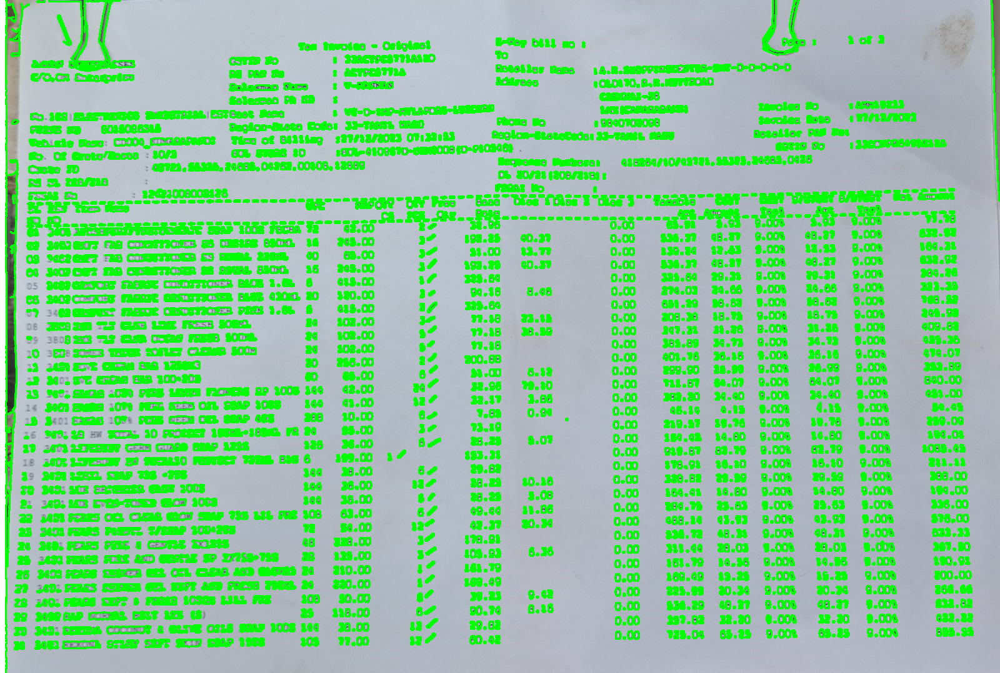

In [19]:
import cv2
import numpy as np
import urllib.request
from PIL import Image
from IPython.display import display

image = cv2.imread('bill_image.jpeg')

# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply GaussianBlur to reduce noise
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Use Canny edge detection
edges = cv2.Canny(blurred, 50, 150)

# Find contours in the edges
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours on the original image
cv2.drawContours(image, contours, -1, (0, 255, 0), 2)

# Display the image with detected contours
display(Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)))

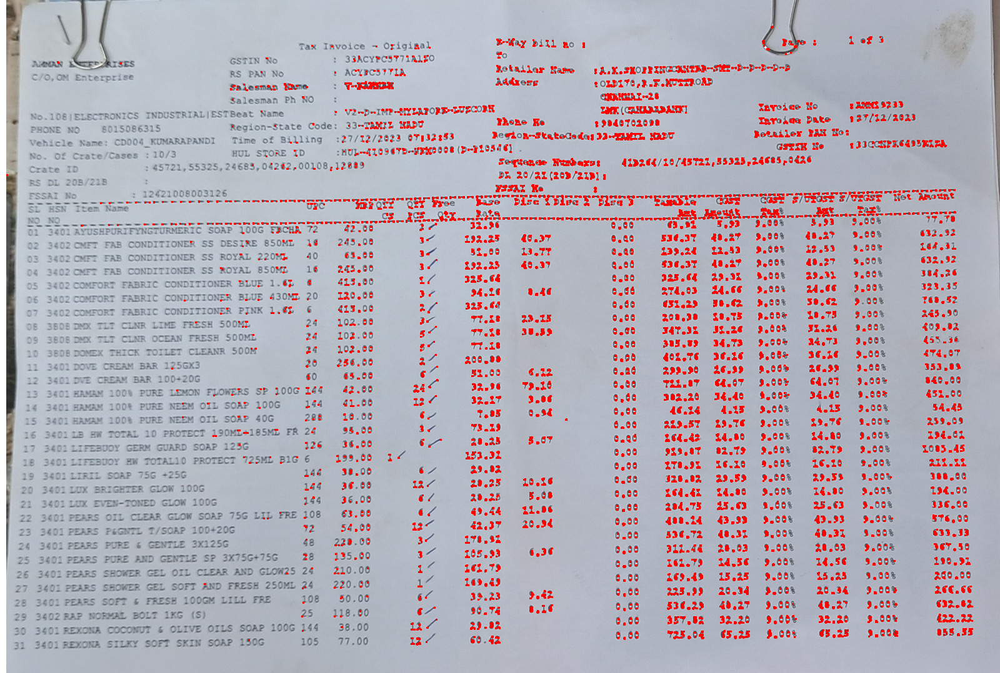

In [20]:
import cv2
import numpy as np
import urllib.request
from PIL import Image
from IPython.display import display

image = cv2.imread('bill_image.jpeg')

# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Harris Corner Detection
corners = cv2.cornerHarris(gray, 2, 3, 0.04)

# Dilate to mark the corners
corners = cv2.dilate(corners, None)

# Threshold the corners to identify strong corners
image[corners > 0.1 * corners.max()] = [0, 0, 255]

# Display the image with highlighted corners
display(Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)))

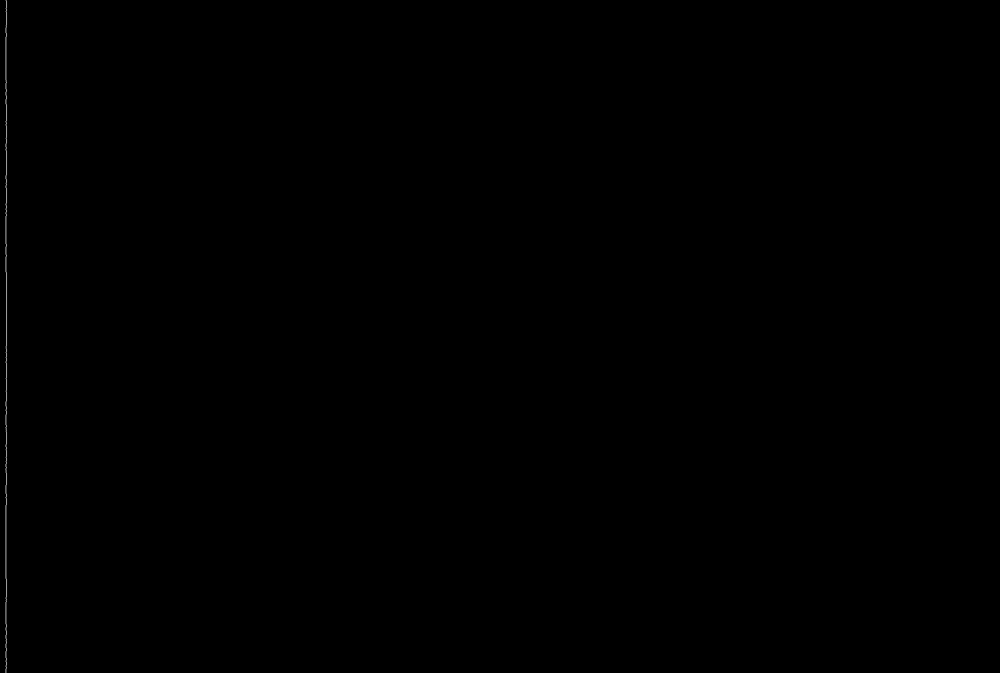

In [30]:
# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply GaussianBlur to reduce noise
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Use Canny edge detection
edges = cv2.Canny(blurred, 50, 500)

# Display the image with detected edges
display(Image.fromarray(edges, 'L'))

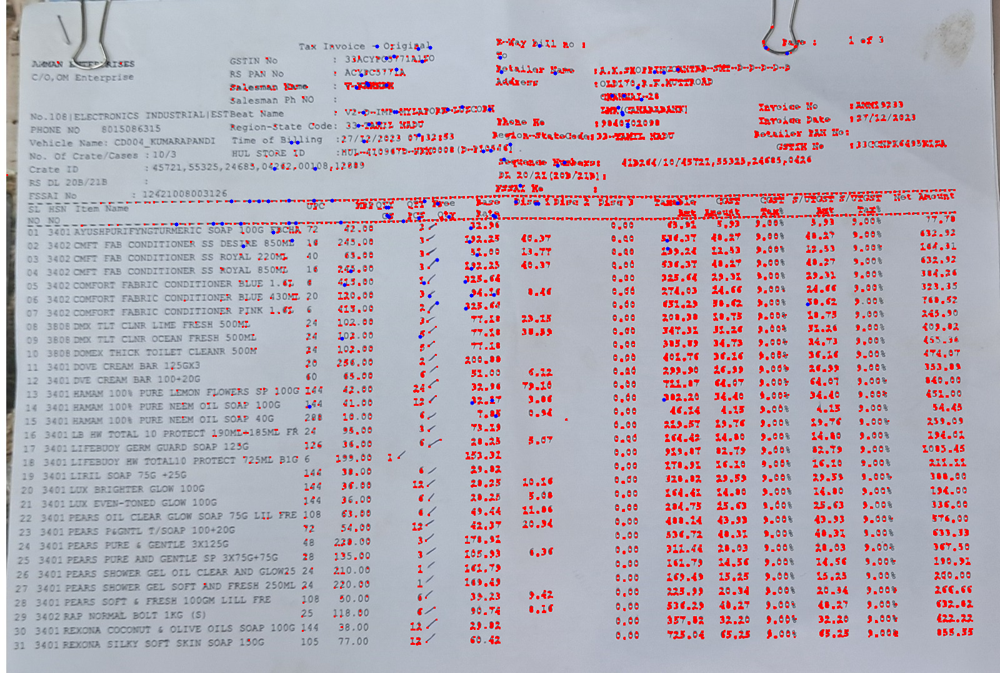

In [34]:

# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Use Shi-Tomasi corner detection
corners = cv2.goodFeaturesToTrack(gray, maxCorners=4, qualityLevel=0.9, minDistance=10)

# Convert corners to integers
corners = np.int0(corners)

# Draw corners on the original image
for corner in corners:
    x, y = corner.ravel()
    cv2.circle(image, (x, y), 3, 255, -1)

# Display the image with highlighted corners
display(Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)))

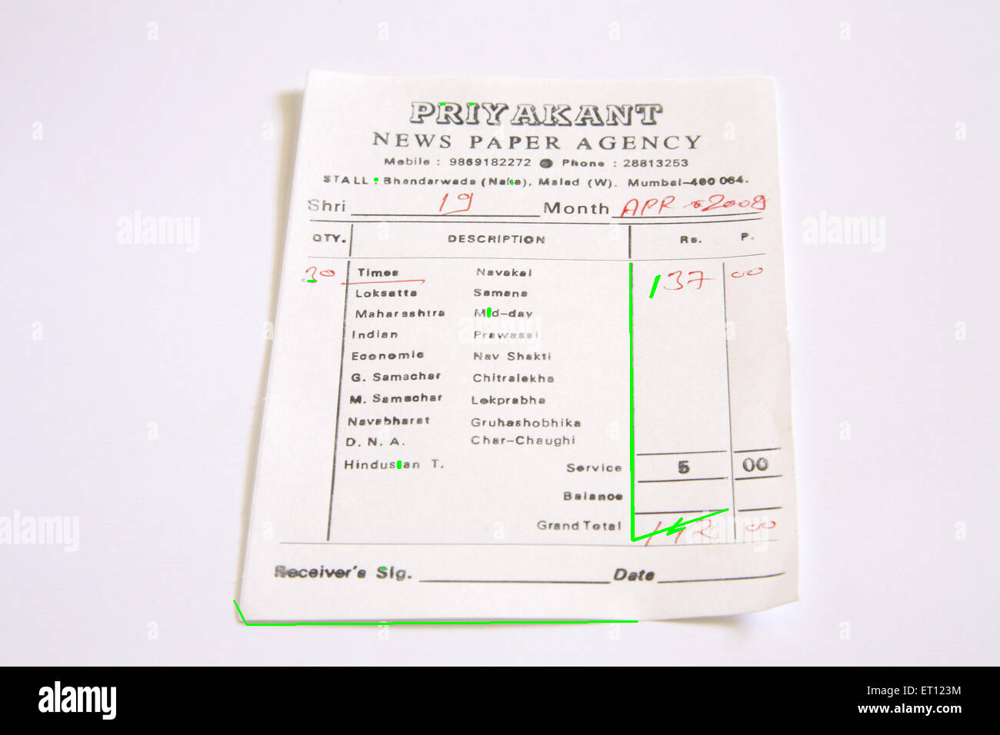

In [39]:
import cv2
import numpy as np
import urllib.request
from PIL import Image
from IPython.display import display

image = cv2.imread('bill_image2.jpg')

# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Use GaussianBlur to reduce noise and improve edge detection
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Use Canny edge detection
edges = cv2.Canny(blurred, 50, 150)

# Find contours in the edge-detected image
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filter contours based on area to identify the square paper
for contour in contours:
    approx = cv2.approxPolyDP(contour, 0.02 * cv2.arcLength(contour, True), True)
    
    # If the contour has 4 vertices (a square), consider it as the paper
    if len(approx) == 4:
        cv2.drawContours(image, [approx], 0, (0, 255, 0), 2)  # Draw the square

# Display the image with the detected square paper
display(Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)))


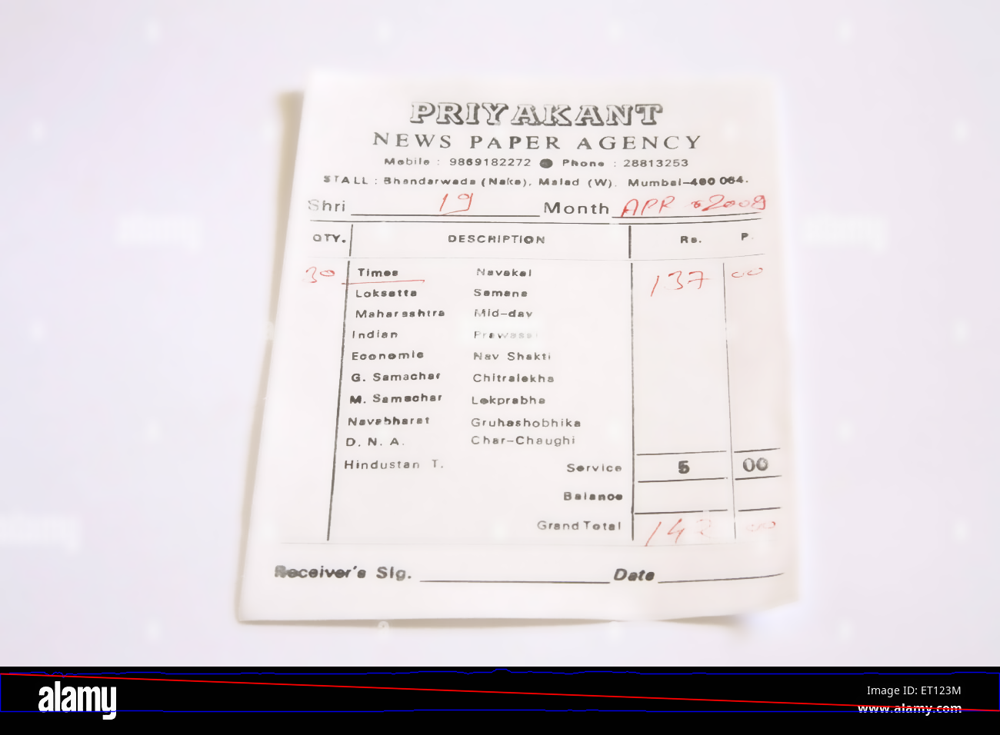

In [38]:
import cv2
import numpy as np
import urllib.request
from PIL import Image
from IPython.display import display


image = cv2.imread('bill_image2.jpg')

# Convert the image to BGR space
img = cv2.bilateralFilter(image, 20, 75, 75)

# Convert BGR to HSV
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Splitting the HSV channels
h, s, v = cv2.split(hsv)

# Doubling the saturation channel
gray_s = cv2.addWeighted(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), 0.0, s, 2.0, 0)

# Thresholding using adaptive thresholding
threshed = cv2.adaptiveThreshold(gray_s, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 109, 10)

# Applying morphological operations of dilation and erosion
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))
morph = cv2.morphologyEx(threshed, cv2.MORPH_OPEN, kernel)

# Finding all the contours
cnts = cv2.findContours(morph, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[-2]

# Sorting the contours and taking the largest contour
cnts = sorted(cnts, key=cv2.contourArea)
cnt = cnts[-1]

# Finding the perimeter of the contour
arclen = cv2.arcLength(cnt, True)

# Finding the end points of the contour by approxPolyDP
approx = cv2.approxPolyDP(cnt, 0.02 * arclen, True)

# Drawing contours on the original image
canvas = img.copy()
cv2.drawContours(canvas, [cnt], -1, (255, 0, 0), 1, cv2.LINE_AA)
cv2.drawContours(canvas, [approx], -1, (0, 0, 255), 1, cv2.LINE_AA)

# Display the image with detected contours
display(Image.fromarray(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB)))


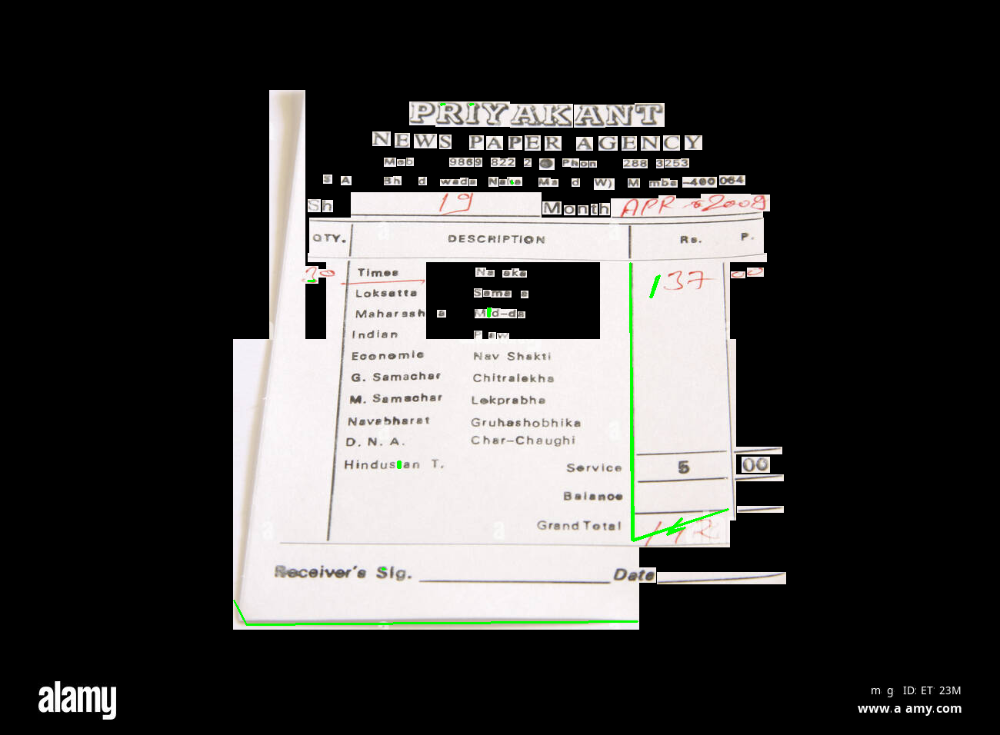

In [40]:
import cv2
import numpy as np
from PIL import Image
from IPython.display import display
import urllib.request

# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Initialize MSER detector
mser = cv2.MSER_create()

# Detect regions using MSER
regions, _ = mser.detectRegions(gray)

# Create a mask to draw regions on
mask = np.zeros_like(gray)

# Draw detected regions on the mask
for region in regions:
    x, y, w, h = cv2.boundingRect(region)
    cv2.rectangle(mask, (x, y), (x + w, y + h), 255, -1)

# Use the mask to extract the detected paper region
detected_paper = cv2.bitwise_and(image, image, mask=mask)

# Display the image with the detected paper region
display(Image.fromarray(cv2.cvtColor(detected_paper, cv2.COLOR_BGR2RGB)))


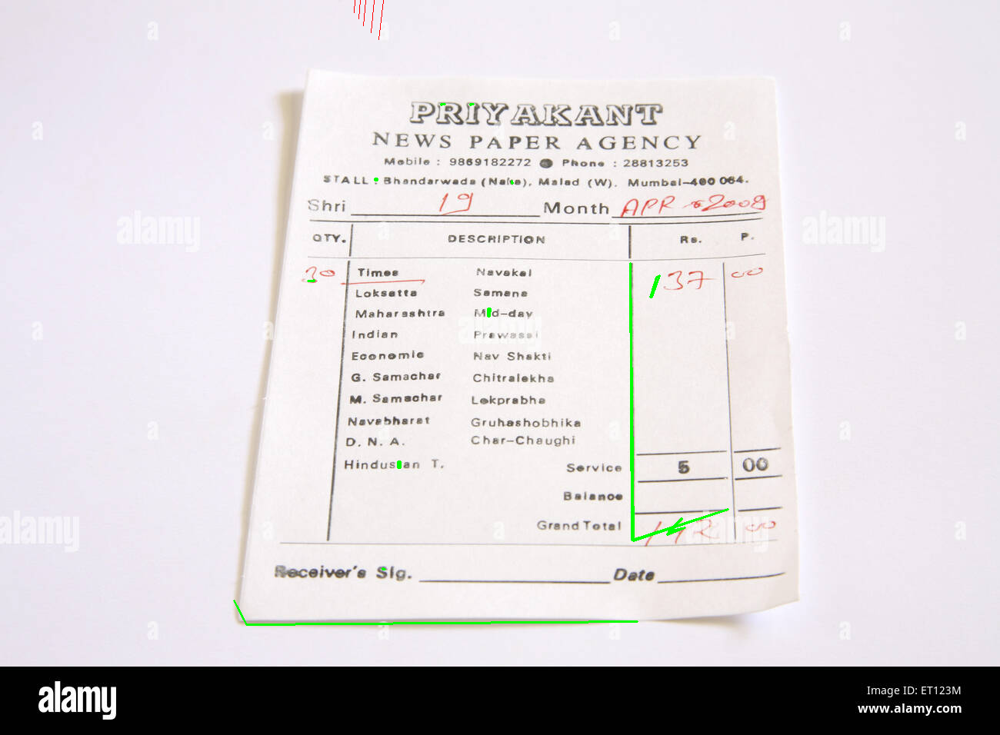

In [41]:
import cv2
import numpy as np
from PIL import Image
from IPython.display import display
import urllib.request


# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Lower Canny edge detection constraints to accept more edges
edges = cv2.Canny(gray, 50, 100)

# Find contours in the edge-detected image
contours, _ = cv2.findContours(edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

# Find the largest closed contour
largest_contour = max(contours, key=cv2.contourArea)

# Draw the largest closed contour on a mask
mask = np.zeros_like(gray)
cv2.drawContours(mask, [largest_contour], -1, 255, thickness=cv2.FILLED)

# Use the mask to extract the detected paper region
detected_paper = cv2.bitwise_and(image, image, mask=mask)

# Convert the detected paper region to grayscale
detected_paper_gray = cv2.cvtColor(detected_paper, cv2.COLOR_BGR2GRAY)

# Use HoughLines standard transform to find lines
lines = cv2.HoughLines(detected_paper_gray, rho=1, theta=np.pi/180, threshold=100)

# Create a lookup table for grouping lines
rho_theta_table = []

# Group lines based on rho and theta values
for line in lines:
    rho, theta = line[0]
    discard_line = False

    for table_rho, table_theta in rho_theta_table:
        if abs(rho - table_rho) < 0.05 * table_rho and abs(theta - table_theta) < 0.05 * table_theta:
            discard_line = True
            break

    if not discard_line:
        rho_theta_table.append((rho, theta))
        cv2.line(image, (int(rho * np.cos(theta)), int(rho * np.sin(theta))),
                 (int(rho * np.cos(theta) + 1000 * np.sin(theta)), int(rho * np.sin(theta) - 1000 * np.cos(theta))),
                 (0, 0, 255), 1)

# Display the original image with detected paper region and lines
display(Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)))


In [1]:
!pip install opencv-python
!pip install opencv-python pytesseract matplotlib
!pip install easyocr

DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.

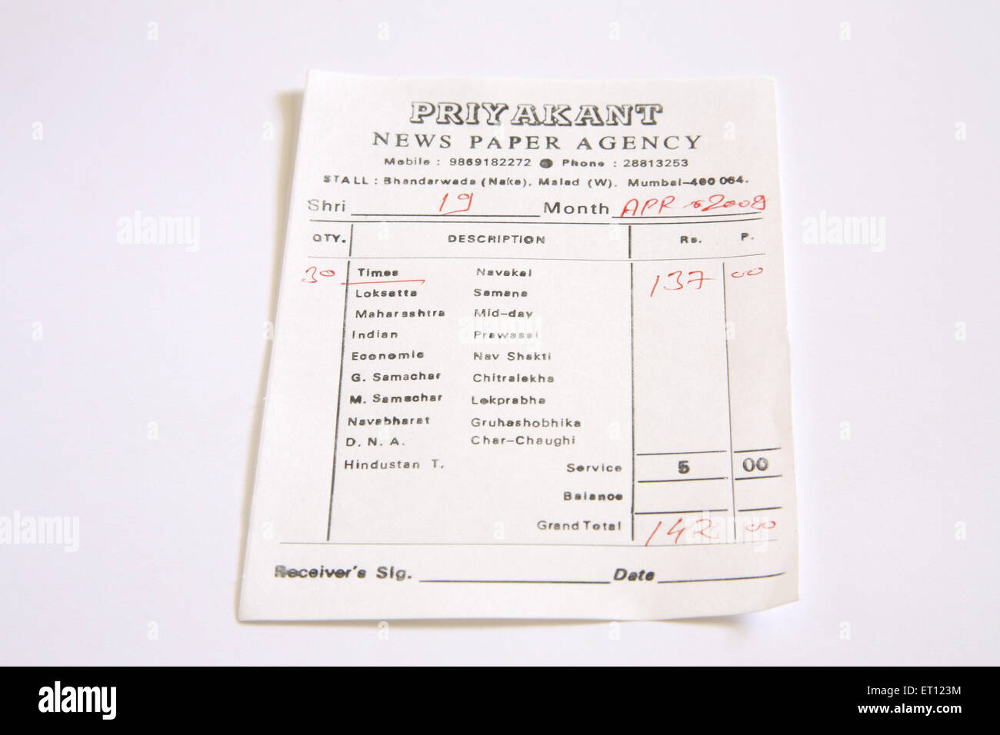

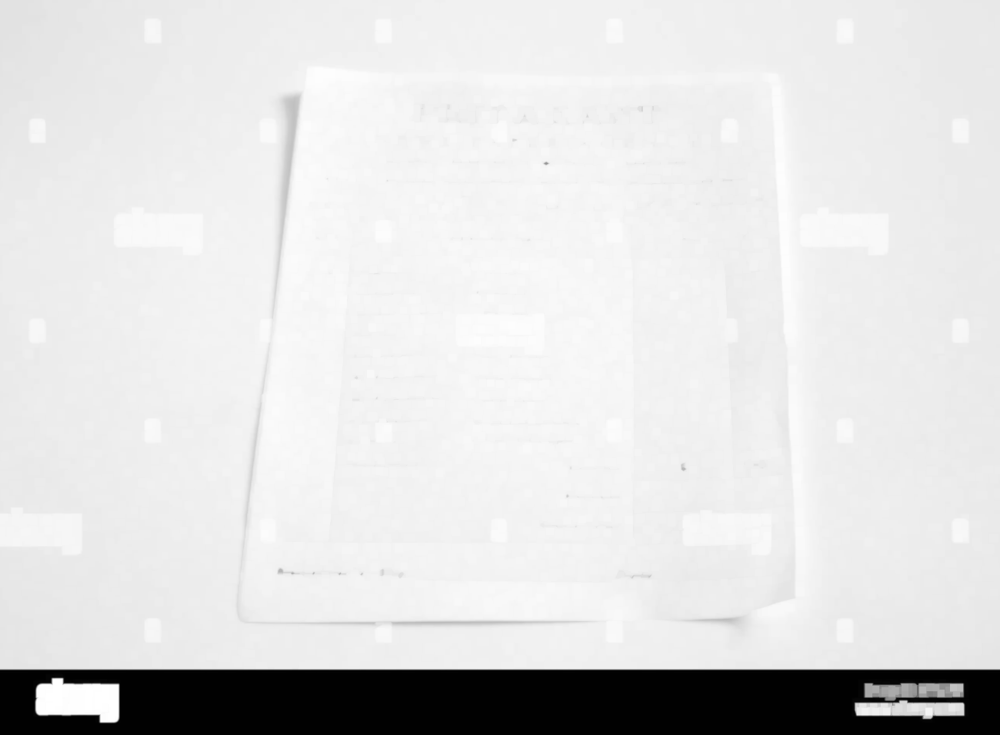

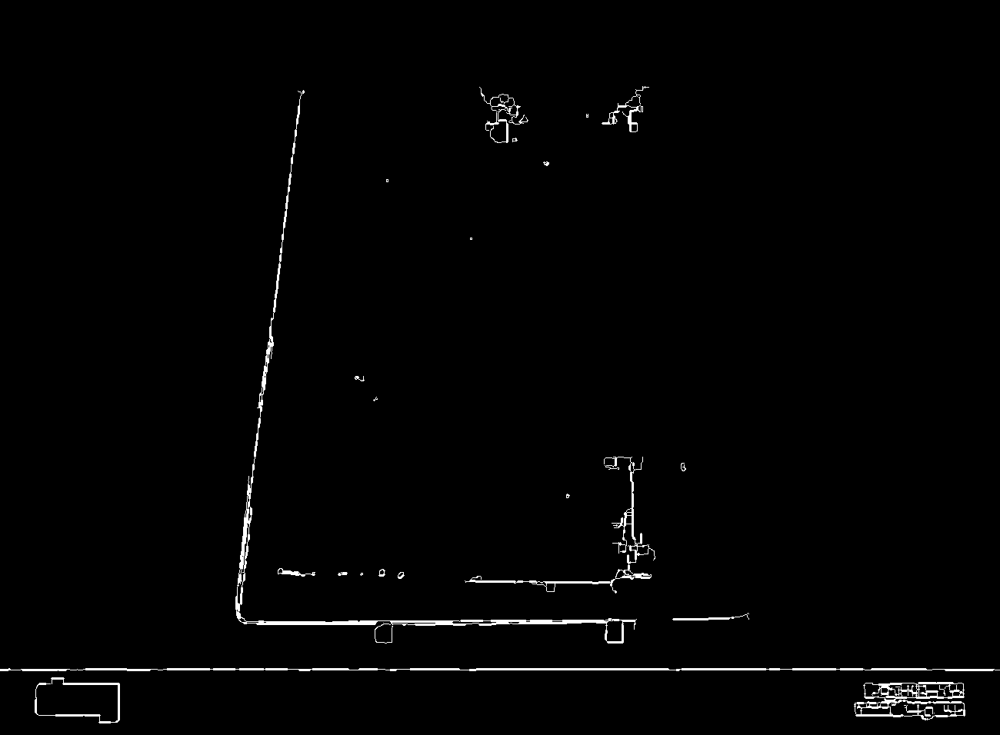

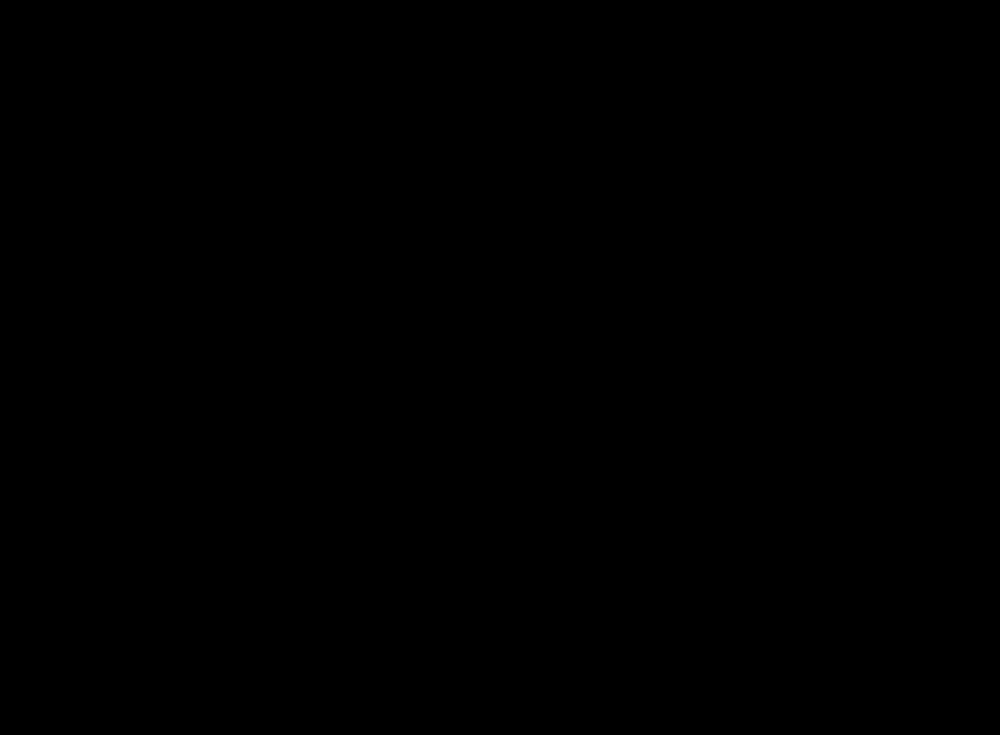

In [3]:
import cv2
import numpy as np
from PIL import Image
from IPython.display import display

def get_new(old):
    new = np.ones(old.shape, np.uint8)
    cv2.bitwise_not(new, new)
    return new

if __name__ == '__main__':
    orig = cv2.imread('bill_image2.jpg')

    # these constants are carefully picked
    MORPH = 9
    CANNY = 84
    HOUGH = 25

    img = cv2.cvtColor(orig, cv2.COLOR_BGR2GRAY)
    cv2.GaussianBlur(img, (3, 3), 0, img)

    # this is to recognize white on white
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (MORPH, MORPH))
    dilated = cv2.dilate(img, kernel)

    edges = cv2.Canny(dilated, 0, CANNY, apertureSize=3)

    lines = cv2.HoughLinesP(edges, 1, np.pi/180, HOUGH)
    for line in lines:
        x1, y1, x2, y2 = line[0]
        cv2.line(edges, (x1, y1), (x2, y2), (255, 0, 0), 2, 8)

    # finding contours
    contours, _ = cv2.findContours(edges.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_TC89_KCOS)
    contours = filter(lambda cont: cv2.arcLength(cont, False) > 100, contours)
    contours = filter(lambda cont: cv2.contourArea(cont) > 10000, contours)

    # simplify contours down to polygons
    rects = []
    for cont in contours:
        rect = cv2.approxPolyDP(cont, 40, True).copy().reshape(-1, 2)
        rects.append(rect)

    # that's basically it
    cv2.drawContours(orig, rects, -1, (0, 255, 0), 1)

    # show only contours
    new = get_new(img)
    cv2.drawContours(new, rects, -1, (0, 255, 0), 1)
    cv2.GaussianBlur(new, (9, 9), 0, new)
    new = cv2.Canny(new, 0, CANNY, apertureSize=3)

    # Convert images to RGB for display
    orig_rgb = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)
    dilated_rgb = cv2.cvtColor(dilated, cv2.COLOR_GRAY2RGB)
    edges_rgb = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)
    new_rgb = cv2.cvtColor(new, cv2.COLOR_GRAY2RGB)

    # Display the images
    display(Image.fromarray(orig_rgb))
    display(Image.fromarray(dilated_rgb))
    display(Image.fromarray(edges_rgb))
    display(Image.fromarray(new_rgb))


In [ ]:
import cv2
import numpy as np

#Load and preprocess image:

img = cv2.imread('bill_image2.jpg')  # Replace with your image path
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (5, 5), 0)  # Reduce noise

#Apply edge detection:
edges = cv2.Canny(blurred, 50, 150)  # Adjust thresholds for optimal results

#Find contours:
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

#Filter contours for bill-like shapes:
approx_polys = [cv2.approxPolyDP(contour, 0.01 * cv2.arcLength(contour, True), True) for contour in contours]
bill_contours = [approx for approx in approx_polys if len(approx) == 4]  # Assuming rectangular bills

#Extract corners and visualize:
for cnt in bill_contours:
    x, y, w, h = cv2.boundingRect(cnt)  # Extract bounding rectangle
    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)  # Draw green rectangle
    corners = cnt.reshape(-1, 2)
    for corner in corners:
        cv2.circle(img, tuple(corner), 5, (0, 0, 255), -1)  # Draw red corners

cv2.imshow('Detected Borders', img)
cv2.waitKey(0)
cv2.destroyAllWindows()


2024-02-22 09:55:01.107 Python[32218:627124] WARNING: Secure coding is not enabled for restorable state! Enable secure coding by implementing NSApplicationDelegate.applicationSupportsSecureRestorableState: and returning YES.


In [ ]:
import cv2
import numpy as np

def detect_bill_outline(image_path):
  """
  Detects the outline of a bill in an image.

  Args:
    image_path: Path to the image file.

  Returns:
    A tuple containing:
      - image: The input image with detected outline highlighted.
      - detected_corners: List of corner coordinates if found.
  """

  img = cv2.imread(image_path)
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  blurred = cv2.GaussianBlur(gray, (5, 5), 0)

  # Apply adaptive thresholding to handle shadows and uneven lighting
  thresh = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)

  # Find contours and filter for potential bill shapes
  contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  filtered_contours = [approx for approx in contours if len(approx) == 4]

  # Find the largest potential bill contour
  max_area = 0
  best_contour = None
  for cnt in filtered_contours:
    area = cv2.contourArea(cnt)
    if area > max_area:
      max_area = area
      best_contour = cnt

  # Validate and approximate the best contour
  if best_contour is not None:
    approx = cv2.approxPolyDP(best_contour, 0.01 * cv2.arcLength(best_contour, True), True)
    if len(approx) == 4:
      detected_corners = approx.reshape(-1, 2).tolist()
      cv2.polylines(img, [detected_corners], True, (0, 255, 0), 2)  # Draw green outline
      return img, detected_corners
    else:
      print("Bill outline not found with enough confidence.")
      return img, None
  else:
    print("No potential bill outlines found in the image.")
    return img, None

# Example usage
image, corners = detect_bill_outline("bill_image2.jpg")
if corners is not None:
  print("Detected corners:", corners)
cv2.imshow('Detected Bill Outline', image)
cv2.waitKey(0)
cv2.destroyAllWindows()


No potential bill outlines found in the image.


2024-02-22 09:59:24.130 Python[37830:739333] WARNING: Secure coding is not enabled for restorable state! Enable secure coding by implementing NSApplicationDelegate.applicationSupportsSecureRestorableState: and returning YES.


In [5]:
import cv2
import numpy as np

def detect_bill_outline(image_path):
    """
    Detects the outline of a bill in an image using a hybrid edge detection approach.

    Args:
        image_path: Path to the image file.

    Returns:
        A tuple containing:
            - image: The input image with the detected outline highlighted (if found).
            - detected_corners: List of corner coordinates if found, or None otherwise.
    """

    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Preprocessing (adjust based on your image)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)  # Reduce noise

    # Edge detection using multiple methods
    canny_edges = cv2.Canny(blurred, 50, 150)
    sobel_edges = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=5)  # Gradient in X direction
    laplacian_edges = cv2.Laplacian(blurred, cv2.CV_64F)
    scharr_edges = cv2.Scharr(blurred, cv2.CV_64F, 0, 1)  # Gradient in Y direction

    # Combine edges using bitwise OR (experiment with other methods)
    # Ensure all edge images have the same size and type
    combined_edges = cv2.bitwise_or(canny_edges, cv2.bitwise_or(sobel_edges, cv2.bitwise_or(laplacian_edges, scharr_edges)))

    # Find contours and filter for potential bill shapes
    contours, _ = cv2.findContours(combined_edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filtered_contours = [approx for approx in contours if len(approx) == 4]

    # Find the largest potential bill contour
    max_area = 0
    best_contour = None
    for cnt in filtered_contours:
        area = cv2.contourArea(cnt)
        if area > max_area:
            max_area = area
            best_contour = cnt

    # Validate and approximate the best contour
    if best_contour is not None:
        approx = cv2.approxPolyDP(best_contour, 0.01 * cv2.arcLength(best_contour, True), True)
        if len(approx) == 4:
            detected_corners = approx.reshape(-1, 2).tolist()
            # Draw outline or process corners based on your desired output
            cv2.polylines(img, [detected_corners], True, (0, 255, 0), 2)  # Draw green outline
            return img, detected_corners
        else:
            print("Bill outline not found with enough confidence.")
            return img, None
    else:
        print("No potential bill outlines found in the image.")
        return img, None

# Example usage (replace with your image path)
image, corners = detect_bill_outline("bill_image2.jpg")
if corners is not None:
    print("Detected corners:", corners)
# Display or process the output image and corners as needed


error: OpenCV(4.9.0) /Users/runner/work/opencv-python/opencv-python/opencv/modules/core/src/arithm.cpp:214: error: (-209:Sizes of input arguments do not match) The operation is neither 'array op array' (where arrays have the same size and type), nor 'array op scalar', nor 'scalar op array' in function 'binary_op'
